<a href="https://colab.research.google.com/github/EureXaAI/EurexaBook/blob/main/demo/eurexa_book_unitree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title 1. 安装依赖库
# 安装 Mujoco: 物理引擎, 广泛用于 RL 和仿真研究
!pip install mujoco
# 安装 Mujoco Mjx: Mujoco 的 JAX 封装, 可微分, 结合 JAX 加速计算
!pip install mujoco_mjx
# 安装 Brax: Google 开发的独立物理引擎, 原生用 JAX 写的
!pip install brax

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 73.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 10.2 MB/s eta 0:00:00


In [ ]:
#@title 2. 检测安装结果
# 从 Colab 中引入文件上传功能（备用）
from google.colab import files

# 引入用于路径和命令行操作的模块
import distutils.util
import os
import subprocess

# 检查是否能够访问 GPU（通过 nvidia-smi 命令）
# 如果失败，就提示用户需要启用 Colab 的 GPU 运行时
if subprocess.run('nvidia-smi').returncode:
  raise RuntimeError(
      '无法与 GPU 通信。请确保你使用的是启用了 GPU 的 Colab 运行时。\n'
      '点击上方菜单「运行时」->「更改运行时类型」，并选择 GPU。')

# 添加一个 ICD 配置，让 glvnd 能找到 Nvidia 的 EGL 驱动
# Colab 虽然有 GPU，但驱动不是通过 APT 安装的，ICD 文件默认缺失
# 这段是手动补上该配置文件（详见 NVIDIA 文档）
NVIDIA_ICD_CONFIG_PATH = '/usr/share/glvnd/egl_vendor.d/10_nvidia.json'
if not os.path.exists(NVIDIA_ICD_CONFIG_PATH):
  with open(NVIDIA_ICD_CONFIG_PATH, 'w') as f:
    f.write("""{
    "file_format_version" : "1.0.0",
    "ICD" : {
        "library_path" : "libEGL_nvidia.so.0"
    }
}
""")

# 设置环境变量，告诉 MuJoCo 使用 GPU EGL (headless) 渲染
print('Setting environment variable to use GPU rendering:')
%env MUJOCO_GL=egl

# 尝试导入 MuJoCo 并用空 XML 检查安装是否成功
# 如果失败，抛出错误并提醒检查运行时设置或安装输出信息
try:
  print('检查 MuJoCo 安装是否成功:')
  import mujoco
  mujoco.MjModel.from_xml_string('<mujoco/>')
except Exception as e:
  raise e from RuntimeError(
      'MuJoCo 安装出错。请检查上方 shell 输出信息。\n'
      '若使用 Colab，请确保启用了 GPU。\n'
      '点击「运行时」->「更改运行时类型」，启用 GPU。')

print('MuJoCo 安装成功！')

# 设置 XLA 编译器参数，启用 Triton GEMM 以提升训练速度（对某些 GPU 有 30% 提升）
xla_flags = os.environ.get('XLA_FLAGS', '')
xla_flags += ' --xla_gpu_triton_gemm_any=True'
os.environ['XLA_FLAGS'] = xla_flags

Setting environment variable to use GPU rendering:
env: MUJOCO_GL=egl
检查 MuJoCo 安装是否成功:
MuJoCo 安装成功！


In [ ]:
#@title 3. 导入用于绘图和图像生成的必要包
# 导入 json 模块，用于处理 JSON 格式的数据（如保存结果或加载配置）
import json

# 导入 itertools，提供高效的迭代器构造工具（如排列组合）
import itertools

# 导入 time 模块，用于计时或设置延时（sleep 等）
import time

# 从 typing 中导入常用的类型注解工具
# Callable（函数类型），List、NamedTuple（结构体），Optional（可空类型），Union（联合类型）
from typing import Callable, List, NamedTuple, Optional, Union

# 导入 numpy，用于数组、矩阵和数值计算
import numpy as np


# ========== 图形绘制和视频支持 ==========

# 打印提示，表示将要安装 mediapy（用于渲染视频）
print("Installing mediapy:")

# 检查 ffmpeg 是否已安装（ffmpeg 用于编码视频）
# 如果未安装，则使用 apt 自动安装 ffmpeg（适用于 Colab）
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)

# 安装 mediapy（用于播放和保存视频/图像）
!pip install -q mediapy

# 导入 mediapy 库（可用于显示仿真结果视频）
import mediapy as media

# 导入 matplotlib 的绘图库，用于绘图（如 reward 曲线）
import matplotlib.pyplot as plt


# ========== numpy 显示优化 ==========

# 设置 numpy 的打印格式：
# precision=3：小数保留 3 位；
# suppress=True：关闭科学计数法；
# linewidth=100：每行最多显示 100 字符，防止换行太多
np.set_printoptions(precision=3, suppress=True, linewidth=100)

Installing mediapy:
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.6 MB/s eta 0:00:00


In [ ]:
#@title 4. 导入 Mujoco, Mujoco Mjx, Brax 所需包
# 导入 datetime，用于记录训练/评估过程中的时间戳
from datetime import datetime

# functools 提供函数工具，比如偏函数（partial）、缓存（lru_cache）等
import functools

# OS 模块，用于操作系统级别的操作，如路径管理、环境变量等
import os

# 类型注解工具，用于标注函数参数或变量的类型，提高代码可读性和类型检查
from typing import Any, Dict, Sequence, Tuple, Union


# ========== Brax 核心物理模拟模块 ==========

# 导入 Brax 的基础模块，包含基础数据结构和方法
from brax import base

# 导入强化学习环境集合（如 humanoid, ant 等）
from brax import envs

# 导入 Brax 提供的数学工具（如四元数运算、旋转等）
from brax import math

# 从 brax.base 中分别导入三大基础类：
# Base：物理模型的基础结构（包含物体、关节等）
# Motion：表示速度、加速度等动态信息
# Transform：表示位置与方向（位姿）
from brax.base import Base, Motion, Transform

# PipelineState：用于表示 Pipeline 模拟器的状态结构（位置、速度等）
from brax.base import State as PipelineState

# 导入基础环境接口类：
# Env：通用环境接口；
# PipelineEnv：基于物理模拟管线的环境；
# State：用于环境交互中的状态表示
from brax.envs.base import Env, PipelineEnv, State

# brax.io 模块提供输入输出功能：
# html：将环境状态渲染为 HTML 格式（可视化）；
# mjcf：读取 MuJoCo 格式的模型文件；
# model：解析模型结构
from brax.io import html, mjcf, model

# MjxState：MJX 模拟（JAX 版 MuJoCo）中的状态结构
from brax.mjx.base import State as MjxState


# ========== PPO 和 SAC 算法模块 ==========

# 导入 PPO 策略网络构建模块
from brax.training.agents.ppo import networks as ppo_networks

# 导入 PPO 强化学习训练接口
from brax.training.agents.ppo import train as ppo

# 导入 SAC 策略网络构建模块
from brax.training.agents.sac import networks as sac_networks

# 导入 SAC 强化学习训练接口
from brax.training.agents.sac import train as sac


# ========== 工具类库和可视化相关 ==========

# etils.epath：Google 的路径管理库（功能类似 pathlib）
from etils import epath

# flax 是 JAX 生态中的神经网络工具包，struct 用于结构化状态定义
from flax import struct

# orbax 是模型保存与加载工具，orbax_utils 是其辅助工具集
from flax.training import orbax_utils

# IPython 的 HTML 显示模块（在 notebook 中插入交互式视频等）
from IPython.display import HTML, clear_output

# 导入 JAX 核心模块
import jax

# JAX 中的 numpy 子模块（支持自动微分与加速）
from jax import numpy as jp

# matplotlib 的绘图库（用于 reward 曲线等）
from matplotlib import pyplot as plt

# mediapy 用于展示视频、保存渲染结果等
import mediapy as media

# ml_collections.config_dict：用于构建灵活的配置字典（如超参数）
from ml_collections import config_dict


# ========== MuJoCo 模拟器模块 ==========

# 导入原生 MuJoCo 引擎（C 语言实现的物理引擎）
import mujoco

# 从 MuJoCo 导入 MJX：MuJoCo 的 JAX 可微版本（mujoco_mjx）
from mujoco import mjx


# ========== 数值计算基础模块 ==========

# numpy 是通用数值计算库（与 jax.numpy 类似，但不支持 GPU 加速）
import numpy as np

# 导入 orbax 的 checkpoint 模块，用于保存和恢复模型权重
from orbax import checkpoint as ocp

In [ ]:
#@title 5. 安装 MuJoCo Playground
# MuJoCo Playground 是一个基于 MuJoCo MJX 构建的, 支持 GPU 加速的强化学习环境套件
!pip install playground

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 26.5 MB/s eta 0:00:00


In [ ]:
#@title 6. 导入 Playground 模块（The Playground）

# 从 mujoco_playground 中导入 wrapper 模块：
# 这个模块通常用于封装环境（env）或模型，使其更易于控制和交互，
# 比如包裹 MuJoCo 模型以简化调用或添加自定义控制接口
from mujoco_playground import wrapper

# 从 mujoco_playground 中导入 registry 模块：
# 用于注册和管理自定义的动作、环境、控制器等，
# 通常可以在其中注册自己的“青蛙跳”等动作动作控制逻辑，方便统一调用
from mujoco_playground import registry

mujoco_menagerie not found. Downloading...


Cloning mujoco_menagerie: ██████████| 100/100 [00:34<00:00]


Checking out commit 14ceccf557cc47240202f2354d684eca58ff8de4
Successfully downloaded mujoco_menagerie


In [ ]:
#@title 7. 查看 MuJoCo Playground 包含的四足和双足环境
registry.locomotion.ALL_ENVS

('BarkourJoystick',
 'BerkeleyHumanoidJoystickFlatTerrain',
 'BerkeleyHumanoidJoystickRoughTerrain',
 'G1JoystickFlatTerrain',
 'G1JoystickRoughTerrain',
 'Go1JoystickFlatTerrain',
 'Go1JoystickRoughTerrain',
 'Go1Getup',
 'Go1Handstand',
 'Go1Footstand',
 'H1InplaceGaitTracking',
 'H1JoystickGaitTracking',
 'Op3Joystick',
 'SpotFlatTerrainJoystick',
 'SpotGetup',
 'SpotJoystickGaitTracking',
 'T1JoystickFlatTerrain',
 'T1JoystickRoughTerrain')

In [ ]:
#@title 8. 训练 Unitree Go1 操纵杆策略
# 操纵杆策略
env_name = 'Go1JoystickFlatTerrain'
# 注册管理环境
env = registry.load(env_name)
# 环境配置
env_cfg = registry.get_default_config(env_name)
# 查看配置
env_cfg

Kd: 0.5
Kp: 35.0
action_repeat: 1
action_scale: 0.5
command_config:
  a:
  - 1.5
  - 0.8
  - 1.2
  b:
  - 0.9
  - 0.25
  - 0.5
ctrl_dt: 0.02
episode_length: 1000
history_len: 1
noise_config:
  level: 1.0
  scales:
    gravity: 0.05
    gyro: 0.2
    joint_pos: 0.03
    joint_vel: 1.5
    linvel: 0.1
pert_config:
  enable: false
  kick_durations:
  - 0.05
  - 0.2
  kick_wait_times:
  - 1.0
  - 3.0
  velocity_kick:
  - 0.0
  - 3.0
reward_config:
  max_foot_height: 0.1
  scales:
    action_rate: -0.01
    ang_vel_xy: -0.05
    dof_pos_limits: -1.0
    energy: -0.001
    feet_air_time: 0.1
    feet_clearance: -2.0
    feet_height: -0.2
    feet_slip: -0.1
    lin_vel_z: -0.5
    orientation: -5.0
    pose: 0.5
    stand_still: -1.0
    termination: -1.0
    torques: -0.0002
    tracking_ang_vel: 0.5
    tracking_lin_vel: 1.0
  tracking_sigma: 0.25
sim_dt: 0.004
soft_joint_pos_limit_factor: 0.95

In [ ]:
#@title 9. 采用 PPO 算法
# 从 mujoco_playground 的 config 模块中导入 locomotion_params
# 这个模块中包含为不同环境（如 humanoid、ant 等）预设的强化学习参数配置
from mujoco_playground.config import locomotion_params

# 调用 locomotion_params 中的 brax_ppo_config 函数，
# 根据当前环境名称（env_name）返回对应的 PPO 训练配置（例如学习率、batch 大小等）
ppo_params = locomotion_params.brax_ppo_config(env_name)

# 显示 ppo_params 的内容（通常是一个 config_dict，包含超参数字典）
ppo_params

action_repeat: 1
batch_size: 256
discounting: 0.97
entropy_cost: 0.01
episode_length: 1000
learning_rate: 0.0003
max_grad_norm: 1.0
network_factory:
  policy_hidden_layer_sizes: &id001 !!python/tuple
  - 512
  - 256
  - 128
  policy_obs_key: state
  value_hidden_layer_sizes: *id001
  value_obs_key: privileged_state
normalize_observations: true
num_envs: 8192
num_evals: 10
num_minibatches: 32
num_resets_per_eval: 1
num_timesteps: 200000000
num_updates_per_batch: 4
reward_scaling: 1.0
unroll_length: 20

In [ ]:
#@title 10. 域随机化函数
# 对摩擦力, 电机, 躯干质心和部件质量等模拟参数进行随机化
registry.get_domain_randomizer(env_name)

<function mujoco_playground._src.locomotion.go1.randomize.domain_randomize(model: mujoco.mjx._src.types.Model, rng: jax.Array)>

In [ ]:
#@title 11. 配置训练信息
# 初始化三个列表用于存储 reward 曲线数据：
# x_data 存储环境步数；
# y_data 存储平均奖励；
# y_dataerr 存储奖励的标准差（用于误差条）
x_data, y_data, y_dataerr = [], [], []

# 记录训练开始时间（用于后续统计时间消耗）
times = [datetime.now()]

# 定义进度回调函数 progress：每次评估调用一次，动态可视化 reward 曲线
def progress(num_steps, metrics):
  # 清空输出（清理前一帧图像，保持 notebook 显示整洁）
  clear_output(wait=True)

  # 记录当前时间和指标数据
  times.append(datetime.now())
  x_data.append(num_steps)
  y_data.append(metrics["eval/episode_reward"])
  y_dataerr.append(metrics["eval/episode_reward_std"])  # 奖励标准差（误差条）

  # 设置图像的横坐标范围（训练步数 + 25% 预留空间）
  plt.xlim([0, ppo_params["num_timesteps"] * 1.25])

  # 设置图像标签
  plt.xlabel("# environment steps")
  plt.ylabel("reward per episode")

  # 标题中显示当前最新的奖励数值
  plt.title(f"y={y_data[-1]:.3f}")

  # 绘制折线图 + 误差条（蓝色线表示奖励曲线）
  plt.errorbar(x_data, y_data, yerr=y_dataerr, color="blue")

  # 在 notebook 中显示图像
  display(plt.gcf())

# 从注册表中获取当前环境的 domain randomizer（用于随机化模拟环境，比如质量、摩擦等）
randomizer = registry.get_domain_randomizer(env_name)

# 将 ppo_params 转为普通 Python 字典，作为训练函数的参数
ppo_training_params = dict(ppo_params)

# 默认的网络构建函数（生成 policy 和 value 网络结构）
network_factory = ppo_networks.make_ppo_networks

# 如果参数中提供了自定义网络结构配置（network_factory 字段）
if "network_factory" in ppo_params:
  # 从训练参数中移除该字段（避免重复传入）
  del ppo_training_params["network_factory"]

  # 用 functools.partial 包装默认网络工厂，传入自定义结构参数
  network_factory = functools.partial(
      ppo_networks.make_ppo_networks,
      **ppo_params.network_factory
  )

# 使用 functools.partial 构建最终的训练函数 train_fn
# 将训练超参数、网络结构、随机器、进度回调函数绑定进去
train_fn = functools.partial(
    ppo.train,
    **dict(ppo_training_params),        # 训练超参数（learning_rate、batch_size 等）
    network_factory=network_factory,    # 策略网络生成函数
    randomization_fn=randomizer,        # 域随机化函数（用于 sim-to-real）
    progress_fn=progress                # 用于实时绘图的进度函数
)

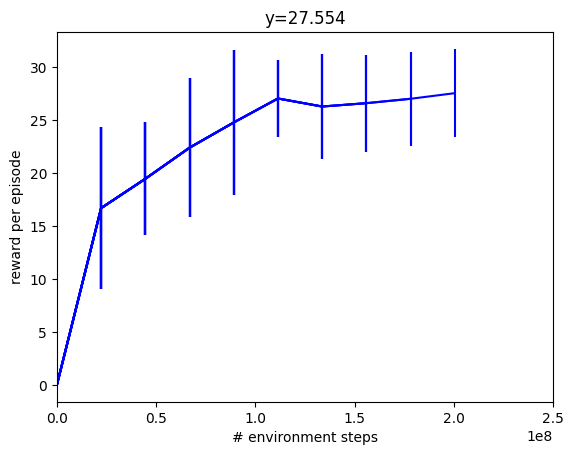

Time to jit: 0:04:05.162541
Time to train: 0:41:59.936333


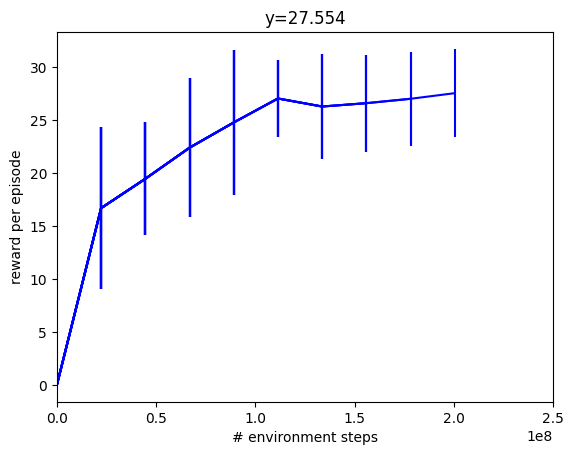

In [ ]:
#@title 12. 训练启动
# 调用前面构造好的训练函数 train_fn，开始训练 agent
# 并返回：
# - make_inference_fn：一个函数，用于后续进行推理/评估（policy）
# - params：训练后得到的模型参数
# - metrics：训练过程中记录的指标（如奖励、损失等）
make_inference_fn, params, metrics = train_fn(
    environment=env,  # 主训练环境（前面定义的 env 对象）

    # 评估环境（eval_env）：用于测试 agent 表现，通常设置与训练环境相同
    # 这里通过 registry 加载，允许指定不同 config（如视觉或随机化配置）
    eval_env=registry.load(env_name, config=env_cfg),

    # 环境包装器：将 MuJoCo 环境包装为符合 Brax 强化学习接口的格式
    wrap_env_fn=wrapper.wrap_for_brax_training,
)

# 打印 JAX 第一次 JIT 编译的耗时（通常发生在第一次训练前）
print(f"Time to jit: {times[1] - times[0]}")
# 打印训练耗时（从 JIT 完成到训练结束）
print(f"Time to train: {times[-1] - times[1]}")

In [ ]:
#@title 13. 配置评估环境
# 获取默认环境配置（包含扰动配置、命令控制等）
env_cfg = registry.get_default_config(env_name)

# 启用扰动功能，测试 agent 在受干扰条件下的鲁棒性
env_cfg.pert_config.enable = True

# 设置扰动的线速度冲击范围（单位 m/s），在指定时间内对 agent 施加干扰
env_cfg.pert_config.velocity_kick = [3.0, 6.0]

# 设置 kick 施加的时间点范围（单位秒）
env_cfg.pert_config.kick_wait_times = [5.0, 15.0]

# 设置运动目标参数（如周期性运动的幅度和频率）
# 参数 a = [x方向幅度, y方向幅度, 频率]，此处使用 2π 表示每秒 1 次完整周期
env_cfg.command_config.a = [1.5, 0.8, 2 * jp.pi]

# 加载带有上述扰动与控制指令的评估环境
eval_env = registry.load(env_name, config=env_cfg)

# 可选项：如果不想启用 velocity kick，可以设为 0 范围（默认关闭）
velocity_kick_range = [0.0, 0.0]  # 表示禁用速度扰动
kick_duration_range = [0.05, 0.2]  # 设置 kick 的持续时间范围（单位秒）

# 使用 JAX 编译环境的 reset 函数，加快初始化速度
jit_reset = jax.jit(eval_env.reset)

# 编译环境的 step 函数，加快仿真步进速度
jit_step = jax.jit(eval_env.step)

# 编译训练后得到的推理函数（policy），设置为 deterministic（去除随机性）
jit_inference_fn = jax.jit(make_inference_fn(params, deterministic=True))

In [ ]:
#@title 14. 展示评估过程
# Rollout 一集 episode，并渲染视频显示 agent 的行为
from mujoco_playground._src.gait import draw_joystick_command

# 控制指令（期望线速度、角速度）
x_vel = 0.0       # x 方向速度
y_vel = 0.0       # y 方向速度
yaw_vel = 3.14    # yaw 角速度（转向）

# 控制命令数组（传入环境）
command = jp.array([x_vel, y_vel, yaw_vel])

# 扰动采样函数：为当前状态添加随机扰动参数（速度、持续时间）
def sample_pert(rng):
    rng, key1, key2 = jax.random.split(rng, 3)
    pert_mag = jax.random.uniform(key1, minval=velocity_kick_range[0], maxval=velocity_kick_range[1])
    duration_seconds = jax.random.uniform(key2, minval=kick_duration_range[0], maxval=kick_duration_range[1])
    duration_steps = jp.round(duration_seconds / eval_env.dt).astype(jp.int32)
    state.info["pert_mag"] = pert_mag
    state.info["pert_duration"] = duration_steps
    state.info["pert_duration_seconds"] = duration_seconds
    return rng

# 初始化随机种子与数据收集容器
rng = jax.random.PRNGKey(0)
rollout = []
modify_scene_fns = []

# 数据采集变量（每帧统计）
swing_peak, rewards, linvel, angvel = [], [], [], []
track, foot_vel, rews, contact = [], [], [], []

# 重置环境
state = jit_reset(rng)

# 如满足扰动条件则应用扰动
if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
    rng = sample_pert(rng)

# 设置初始控制命令
state.info["command"] = command

# 开始执行完整 episode（step-by-step）
for i in range(env_cfg.episode_length):
    if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
        rng = sample_pert(rng)

    act_rng, rng = jax.random.split(rng)
    ctrl, _ = jit_inference_fn(state.obs, act_rng)
    state = jit_step(state, ctrl)
    state.info["command"] = command

    # 收集奖励、轨迹、速度、接触、脚速等信息
    rews.append({k: v for k, v in state.metrics.items() if k.startswith("reward/")})
    rollout.append(state)
    swing_peak.append(state.info["swing_peak"])
    rewards.append({k[7:]: v for k, v in state.metrics.items() if k.startswith("reward/")})
    linvel.append(env.get_global_linvel(state.data))
    angvel.append(env.get_gyro(state.data))
    track.append(env._reward_tracking_lin_vel(state.info["command"], env.get_local_linvel(state.data)))

    feet_vel = state.data.sensordata[env._foot_linvel_sensor_adr]
    vel_xy = feet_vel[..., :2]
    vel_norm = jp.sqrt(jp.linalg.norm(vel_xy, axis=-1))
    foot_vel.append(vel_norm)

    contact.append(state.info["last_contact"])

    # 获取 agent 位置与朝向，并可视化控制命令方向箭头
    xyz = np.array(state.data.xpos[env._torso_body_id])
    xyz += np.array([0, 0, 0.2])  # 抬高显示位置
    x_axis = state.data.xmat[env._torso_body_id, 0]
    yaw = -np.arctan2(x_axis[1], x_axis[0])
    modify_scene_fns.append(
        functools.partial(
            draw_joystick_command,
            cmd=state.info["command"],
            xyz=xyz,
            theta=yaw,
            scl=abs(state.info["command"][0]) / env_cfg.command_config.a[0],
        )
    )

# 设置渲染采样间隔（每隔几帧采样一帧），并计算帧率
render_every = 2
fps = 1.0 / eval_env.dt / render_every
traj = rollout[::render_every]
mod_fns = modify_scene_fns[::render_every]

# 设置渲染选项：开启接触点、扰动显示等
scene_option = mujoco.MjvOption()
scene_option.geomgroup[2] = True
scene_option.geomgroup[3] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_CONTACTPOINT] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_TRANSPARENT] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_PERTFORCE] = True

# 渲染轨迹为图像帧序列
frames = eval_env.render(
    traj,
    camera="track",
    scene_option=scene_option,
    width=640,
    height=480,
    modify_scene_fns=mod_fns,
)

# 显示渲染视频
media.show_video(frames, fps=fps, loop=False)

100%|██████████| 500/500 [00:03<00:00, 136.60it/s]


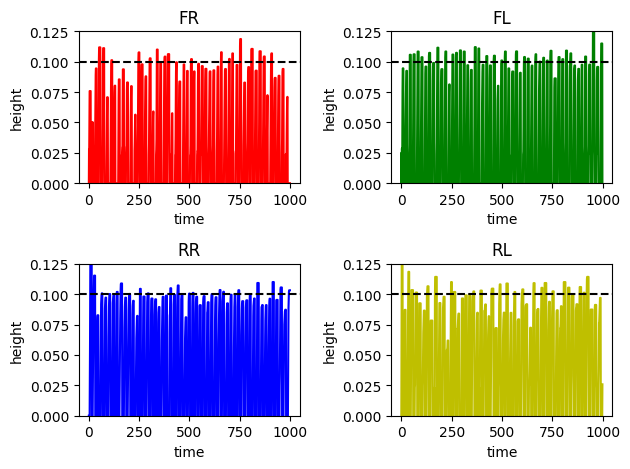

In [ ]:
#@title 15. 绘制每条腿的抬脚高度（swing_peak）

# 将 swing_peak 列表转为 JAX 数组，维度：[时间步, 4条腿]
swing_peak = jp.array(swing_peak)

# 设置腿的名字和颜色（用于每条腿的子图标题和颜色）
names = ["FR", "FL", "RR", "RL"]  # 前右、前左、后右、后左
colors = ["r", "g", "b", "y"]

# 创建一个 2x2 的子图布局
fig, axs = plt.subplots(2, 2)

# 遍历每条腿，分别在一个子图中绘制其抬脚高度随时间的变化
for i, ax in enumerate(axs.flat):
    ax.plot(swing_peak[:, i], color=colors[i])  # 绘制第 i 条腿的高度曲线
    ax.set_ylim([0, env_cfg.reward_config.max_foot_height * 1.25])  # 设置 y 轴范围（略高于最大高度）
    ax.axhline(env_cfg.reward_config.max_foot_height, color="k", linestyle="--")  # 添加参考线（最大允许高度）
    ax.set_title(names[i])  # 设置子图标题（腿名）
    ax.set_xlabel("time")
    ax.set_ylabel("height")

# 优化子图布局，防止重叠
plt.tight_layout()
plt.show()

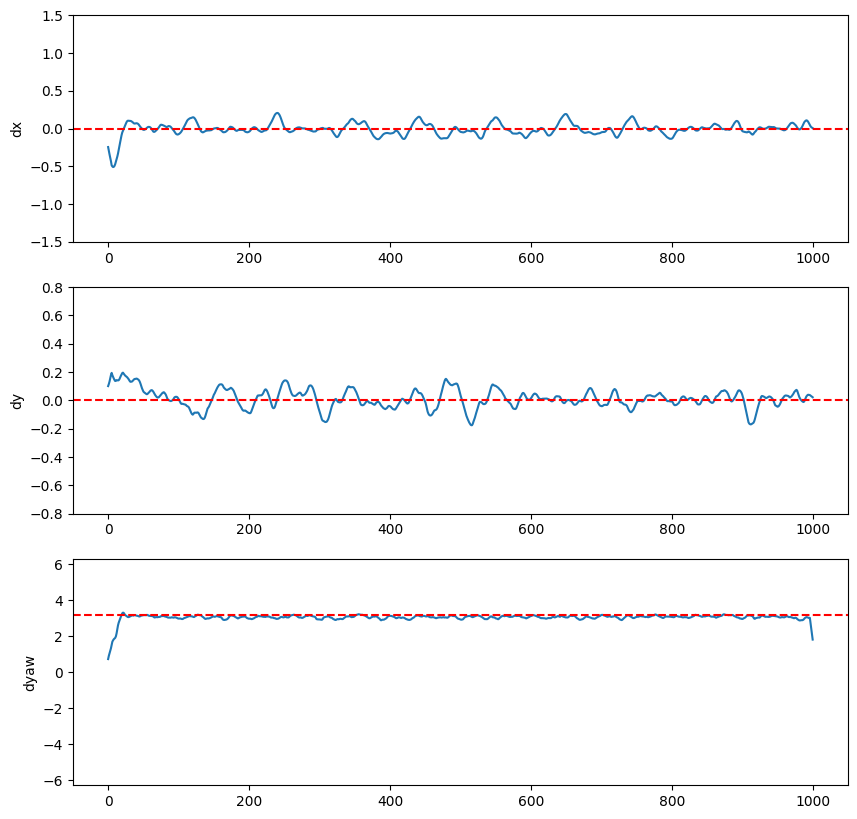

In [ ]:
#@title 16. 绘制速度匹配情况（是否跟随控制命令）

# 从 linvel 和 angvel 中提取所需维度的时间序列
linvel_x = jp.array(linvel)[:, 0]      # x方向线速度
linvel_y = jp.array(linvel)[:, 1]      # y方向线速度
angvel_yaw = jp.array(angvel)[:, 2]    # yaw方向角速度

# 用滑动平均（长度10窗口）对数据进行平滑处理
linvel_x = jp.convolve(linvel_x, jp.ones(10) / 10, mode="same")
linvel_y = jp.convolve(linvel_y, jp.ones(10) / 10, mode="same")
angvel_yaw = jp.convolve(angvel_yaw, jp.ones(10) / 10, mode="same")

# 创建三个子图用于显示 dx、dy、dyaw 的跟踪曲线
fig, axes = plt.subplots(3, 1, figsize=(10, 10))
axes[0].plot(linvel_x)
axes[1].plot(linvel_y)
axes[2].plot(angvel_yaw)

# 设置 y 轴显示范围：根据命令中设置的最大幅度设定
axes[0].set_ylim(-env_cfg.command_config.a[0], env_cfg.command_config.a[0])
axes[1].set_ylim(-env_cfg.command_config.a[1], env_cfg.command_config.a[1])
axes[2].set_ylim(-env_cfg.command_config.a[2], env_cfg.command_config.a[2])

# 每个子图添加一条红色虚线表示目标速度（command）
for i, ax in enumerate(axes):
    ax.axhline(state.info["command"][i], color="red", linestyle="--")

# 设置每个子图的标签
labels = ["dx", "dy", "dyaw"]
for i, ax in enumerate(axes):
    ax.set_ylabel(labels[i])

In [ ]:
#@title 17. 慢慢增加 x 方向控制命令（前进速度）并观察机器人反应

# 初始化随机种子、数据缓存容器
rng = jax.random.PRNGKey(0)
rollout = []
modify_scene_fns = []
swing_peak = []
linvel = []
angvel = []

# 初始前向速度为 -0.25（轻微后退）
x = -0.25
command = jp.array([x, 0, 0])  # 控制命令：[x_vel, y_vel, yaw_vel]

# 重置环境状态
state = jit_reset(rng)

# 执行 1400 步仿真，每隔 200 步提升一次前向速度
for i in range(1_400):
    # 每隔 200 步，提升前向速度 +0.25 m/s
    if i % 200 == 0:
        x += 0.25
        print(f"Setting x to {x}")
        command = jp.array([x, 0, 0])

    # 更新命令信息（用于 reward 和渲染）
    state.info["command"] = command

    # 如果到了扰动时间点，采样扰动
    if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
        rng = sample_pert(rng)

    # 推理动作 + 模拟一步
    act_rng, rng = jax.random.split(rng)
    ctrl, _ = jit_inference_fn(state.obs, act_rng)
    state = jit_step(state, ctrl)

    # 收集数据
    rollout.append(state)
    swing_peak.append(state.info["swing_peak"])
    linvel.append(env.get_global_linvel(state.data))
    angvel.append(env.get_gyro(state.data))

    # 获取 torso 的位置和朝向（用于绘制控制箭头）
    xyz = np.array(state.data.xpos[env._torso_body_id]) + np.array([0, 0, 0.2])
    x_axis = state.data.xmat[env._torso_body_id, 0]
    yaw = -np.arctan2(x_axis[1], x_axis[0])

    modify_scene_fns.append(
        functools.partial(
            draw_joystick_command,
            cmd=command,
            xyz=xyz,
            theta=yaw,
            scl=abs(command[0]) / env_cfg.command_config.a[0],
        )
    )



Setting x to 0.0
Setting x to 0.25
Setting x to 0.5
Setting x to 0.75
Setting x to 1.0
Setting x to 1.25
Setting x to 1.5


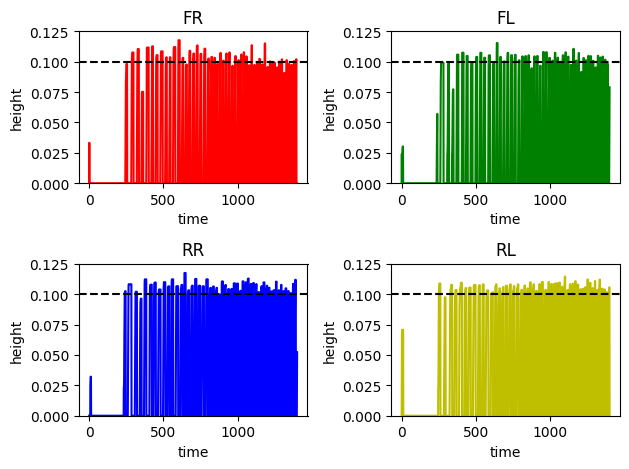

In [ ]:
#@title 18. 绘制每条腿的抬脚高度（四张子图）

# 将列表 swing_peak 转换为 JAX 数组（shape: [时间步数, 4]）
# 每一列表示一条腿在每个时间步的抬脚高度（swing peak）
swing_peak = jp.array(swing_peak)

# 设置每条腿的名称（用于子图标题）：FR=前右，FL=前左，RR=后右，RL=后左
names = ["FR", "FL", "RR", "RL"]

# 为每条腿设置一条颜色：红、绿、蓝、黄
colors = ["r", "g", "b", "y"]

# 创建一个 2x2 的子图布局（4 个子图）
fig, axs = plt.subplots(2, 2)

# 遍历每条腿和对应的子图
for i, ax in enumerate(axs.flat):
    # 绘制第 i 条腿在所有时间步的抬脚高度曲线
    ax.plot(swing_peak[:, i], color=colors[i])

    # 设置 y 轴范围为 [0, 最大设定抬脚高度的 1.25 倍]，方便观察是否过高或偏低
    ax.set_ylim([0, env_cfg.reward_config.max_foot_height * 1.25])

    # 添加一条虚线表示最大允许的抬脚高度（设定值）
    ax.axhline(env_cfg.reward_config.max_foot_height, color="k", linestyle="--")

    # 设置子图标题为该腿的名称（如 FR、FL）
    ax.set_title(names[i])

    # 设置横轴为时间（帧）
    ax.set_xlabel("time")

    # 设置纵轴为高度
    ax.set_ylabel("height")

# 自动调整子图排布，避免标签/标题重叠
plt.tight_layout()

# 显示图像
plt.show()

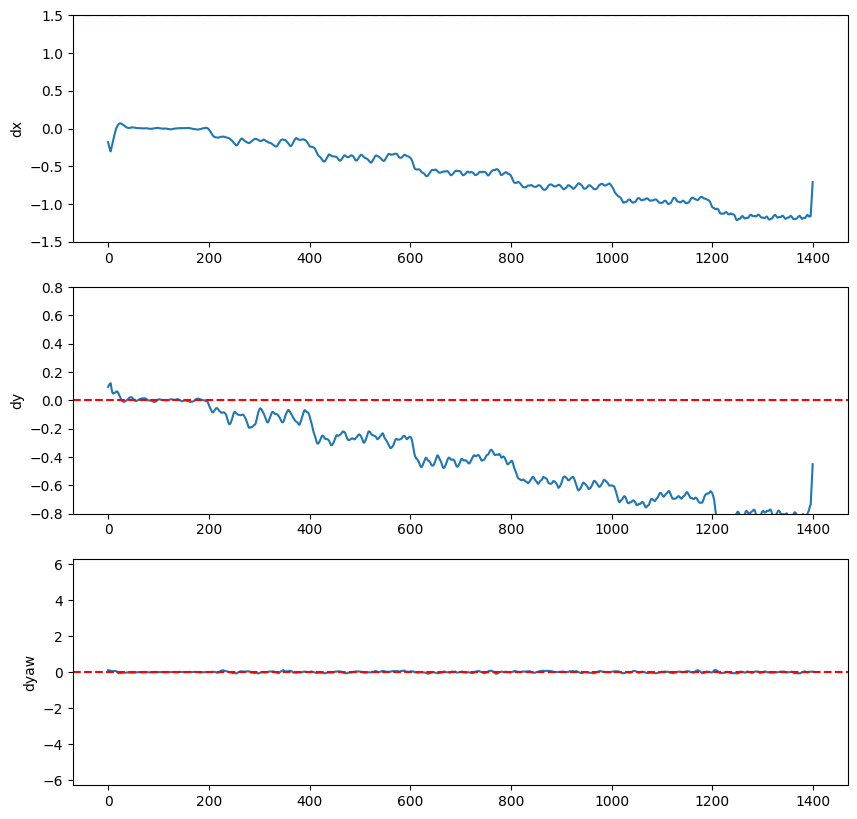

In [ ]:
#@title 19. 提取速度数据并绘制与命令的对比曲线
# 数据提取
linvel_x = jp.array(linvel)[:, 0]
linvel_y = jp.array(linvel)[:, 1]
angvel_yaw = jp.array(angvel)[:, 2]

# 滑动平均平滑
linvel_x = jp.convolve(linvel_x, jp.ones(10) / 10, mode="same")
linvel_y = jp.convolve(linvel_y, jp.ones(10) / 10, mode="same")
angvel_yaw = jp.convolve(angvel_yaw, jp.ones(10) / 10, mode="same")

# 三张图依次绘制 x 速度、y 速度、yaw 角速度
fig, axes = plt.subplots(3, 1, figsize=(10, 10))
axes[0].plot(linvel_x)
axes[1].plot(linvel_y)
axes[2].plot(angvel_yaw)

# 设置 y 轴范围为控制命令允许范围
axes[0].set_ylim(-env_cfg.command_config.a[0], env_cfg.command_config.a[0])
axes[1].set_ylim(-env_cfg.command_config.a[1], env_cfg.command_config.a[1])
axes[2].set_ylim(-env_cfg.command_config.a[2], env_cfg.command_config.a[2])

# 添加红线指示目标速度
for i, ax in enumerate(axes):
    ax.axhline(state.info["command"][i], color="red", linestyle="--")

# 设置标签
labels = ["dx", "dy", "dyaw"]
for i, ax in enumerate(axes):
    ax.set_ylabel(labels[i])

In [ ]:
#@title 20. 渲染视频：慢速控制 + 视觉化

# 渲染参数
render_every = 2  # 每隔2步渲染一帧
fps = 1.0 / eval_env.dt / render_every
print(f"fps: {fps}")

# 抽帧得到用于渲染的轨迹 + 每帧修改函数（如箭头）
traj = rollout[::render_every]
mod_fns = modify_scene_fns[::render_every]
assert len(traj) == len(mod_fns)

# 配置可视化选项：显示接触点、干扰力
scene_option = mujoco.MjvOption()
scene_option.geomgroup[2] = True
scene_option.geomgroup[3] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_CONTACTPOINT] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_PERTFORCE] = True

# 渲染帧图像
frames = eval_env.render(
    traj,
    camera="track",
    height=480,
    width=640,
    modify_scene_fns=mod_fns,
    scene_option=scene_option,
)

# 播放视频
media.show_video(frames, fps=fps, loop=False)

fps: 25.0


100%|██████████| 700/700 [00:05<00:00, 121.99it/s]
